In [1]:
import torch
from torch.utils.data import DataLoader 
import torchvision.transforms as T
import yaml
import os
import matplotlib.pyplot as plt
from utils.utils import CosineLoss
from models.features_extractors import EfficientNet_feature_B5
import os
from utils.utils import Gaussian
from dataset.video_dataset import ImageSequenceDataset
import onnxruntime as ort
import numpy as np

plt.rcParams['figure.figsize'] = [52, 12]
plt.rcParams['figure.dpi'] = 300 # 200 e.g. is really fine, but slower

/workspaces/XLIM_Thesis/env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
with open('config_inference.yaml', 'r') as file:
    config = yaml.safe_load(file)

    
data_visu_path = 'data_visu/AD'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the exported ONNX model
onnx_model_path = config['general_config']['weight_path_VMTAD_onnx']
VMTAD_session = ort.InferenceSession(onnx_model_path, providers=['CUDAExecutionProvider'])
feature_extraction = EfficientNet_feature_B5(config)


preprocessing_efficientnet = T.Compose([
    T.Resize((config['general_config']['image_size'], 
              config['general_config']['image_size']), 
             interpolation=T.InterpolationMode.BICUBIC),
    T.ToTensor(),
    T.Normalize(mean=[0.4850, 0.4560, 0.4060],
                std=[0.2290, 0.2240, 0.2250])
])

inv = T.Compose([ T.Normalize(mean = [ 0., 0., 0. ],
                                                    std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                T.Normalize(mean = [ -0.485, -0.456, -0.406 ],
                                                    std = [ 1., 1., 1. ])   ])

# Create validation dataset
dataset_val = ImageSequenceDataset(
    os.path.join(data_visu_path),
    1,
    preprocessing_efficientnet,
)

dataloader_val = DataLoader(
    dataset_val,
    batch_size=1,
    shuffle=False
)


#setup tqdm
loss_eval = []
loss_visu = CosineLoss()
gs_filter = Gaussian('cuda')

Unexpected keys (bn2.num_batches_tracked, bn2.bias, bn2.running_mean, bn2.running_var, bn2.weight, classifier.bias, classifier.weight, conv_head.weight) found while loading pretrained weights. This may be expected if model is being adapted.


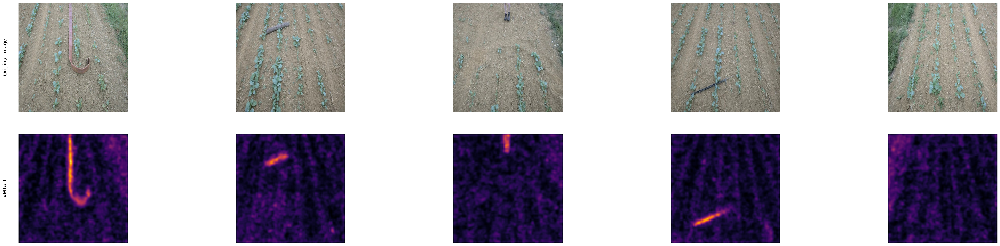

In [4]:
i = 0
figs, axs = plt.subplots(2,5)
axs[0,0].text(-0.1, 0.5, "Original image", 
        rotation=90, 
        va='center', 
        ha='right', 
        transform=axs[0,0].transAxes,
        fontsize=14)
axs[1,0].text(-0.1, 0.5, "VMTAD", 
        rotation=90, 
        va='center', 
        ha='right', 
        transform=axs[1,0].transAxes,
        fontsize=14)

for y, (folder, images) in enumerate(dataloader_val) :
    
    
    if y == 0 : last_folder = folder
    if y!=0 and folder!=last_folder :
                last_folder = folder
                axs[0,i].imshow(inv(image_gpu)[0].permute(1,2,0).cpu())
                axs[0,i].axis('off')
                axs[1,i].imshow(visu_VMTAD[0], cmap='inferno', vmax=0.08)
                axs[1,i].axis('off')
                i+=1
        
    with torch.no_grad():
        image_gpu = images[0].to(device)
        onnx_input_name = VMTAD_session.get_inputs()[0].name  
        input_features=feature_extraction(image_gpu).detach().cpu().numpy().astype(np.float32)
        outputs = VMTAD_session.run(None, {'input.1': input_features})
        output = outputs[0]
        src = outputs[1]
        visu_loss = loss_visu(torch.from_numpy(output).to('cuda'),torch.from_numpy(src).to('cuda'))
        visu_VMTAD = gs_filter(visu_loss).detach().cpu().numpy()
        
        
axs[0,i].imshow(inv(images[0])[0].permute(1,2,0).cpu())
axs[0,i].axis('off')
axs[1,i].imshow(visu_VMTAD[0], cmap='inferno',vmax=0.08)
axs[1,i].axis('off')

plt.show()

